In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

Sataset link : 	https://www.kaggle.com/rohanharode07/webmd-drug-reviews-dataset

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#set default style to seaborn and matplotlib
sns.set_style('darkgrid')
plt.rcParams['font.size'] = 14
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['figure.facecolor'] = '#00000000'

In [4]:
pd.options.display.max_rows = 50

# Load and read  dataset

In [5]:
df = pd.read_csv('/content/drive/MyDrive/webmd.csv')

In [6]:
df.shape

(362806, 12)

Dataset Information

           
    1 Drug (categorical): name of drug         
    2 DrugId (numerical): drug id         
    3 Condition (categorical): name of condition          
    4 Review (text): patient review           
    5 Side (text): side effects associated with drug (if any)          
    6 EaseOfUse (numerical): 5 star rating        
    7 Effectiveness (numerical): 5 star rating          
    8 Satisfaction (numerical): 5 star rating      
    9 Date (date): date of review entry         
    10 UsefulCount (numerical): number of users who found review useful.        
    11 Age (numerical): age group range of user        
    12 Sex (categorical): gender of user         


In [7]:
df.head()

,Age,Condition,Date,Drug,DrugId,EaseofUse,Effectiveness,Reviews,Satisfaction,Sex,Sides,UsefulCount
0,75 or over,Stuffy Nose,9/21/2014,25dph-7.5peh,146724,5,5,I'm a retired physician and of all the meds I ...,5,Male,"Drowsiness, dizziness , dry mouth /nose/thro...",0
1,25-34,Cold Symptoms,1/13/2011,25dph-7.5peh,146724,5,5,cleared me right up even with my throat hurtin...,5,Female,"Drowsiness, dizziness , dry mouth /nose/thro...",1
2,65-74,Other,7/16/2012,warfarin (bulk) 100 % powder,144731,2,3,why did my PTINR go from a normal of 2.5 to ov...,3,Female,,0
3,75 or over,Other,9/23/2010,warfarin (bulk) 100 % powder,144731,2,2,FALLING AND DON'T REALISE IT,1,Female,,0
4,35-44,Other,1/6/2009,warfarin (bulk) 100 % powder,144731,1,1,My grandfather was prescribed this medication ...,1,Male,,1


# Data Cleaning

In [8]:
df.isna().sum()

Age               0
Condition         0
Date              0
Drug              0
DrugId            0
EaseofUse         0
Effectiveness     0
Reviews          37
Satisfaction      0
Sex               0
Sides             0
UsefulCount       0
dtype: int64

In [9]:
#Univariate Analysis (Categorical Features)

In [10]:
#Side effects
df.Sides.value_counts()

                                                                                                                                                                                                                             17460
Nausea ,  vomiting ,  constipation ,  lightheadedness ,  dizziness , or drowsiness may occur.                                                                                                                                15563
Nausea ,  vomiting ,  headache ,  bloating ,  breast  tenderness, swelling of the  ankles /feet (fluid retention), or  weight  change may occur.                                                                             12116
Dizziness ,  lightheadedness , tiredness, or  headache  may occur as your body adjusts to the  medication . Dry  cough  may also occur.                                                                                       9162
Drowsiness,  dizziness , loss of coordination, tiredness, blurred/ double vision , unusual  

       17460 empty values.  


      According to dataset information from webmd, data is recorded only if there is any side effects. So an empty value means there is no side effects

In [11]:
#Replacing empty strings in Sides column

df["Sides"].replace({"": ''}, inplace=True)
df["Sides"].replace({" ": 'No Side Effects'}, inplace=True)
#df["Sides"].replace({"NaN": np.nan}, inplace=True)

In [12]:
df.Sides.value_counts()

No Side Effects                                                                                                                                     17460
Nausea ,  vomiting ,  constipation ,  lightheadedness ,  dizziness , or drowsiness may occur.                                                       15563
Nausea ,  vomiting ,  headache ,  bloating ,  breast  tenderness, swelling of the  ankles /feet (fluid retention), or  weight  change may occur.    12116
Dizziness ,  lightheadedness , tiredness, or  headache  may occur as your body adjusts to the  medication . Dry  cough  may also occur.              9162
Drowsiness,  dizziness , loss of coordination, tiredness, blurred/ double vision , unusual  eye  movements, or shaking (tremor) may occur.           7790
                                                                                                                                                    ...  
Nausea ,  stomach pain ,  diarrhea ,  constipation , or pain/redness at the 

In [13]:
#Drop the null values
df = df.dropna()

In [14]:
#Date 
df.Date.value_counts()

10/29/2007    404
10/30/2007    316
10/28/2007    315
3/15/2010     308
3/16/2010     295
             ... 
10/18/2019      2
10/20/2019      1
6/22/2019       1
10/27/2019      1
6/28/2019       1
Name: Date, Length: 4524, dtype: int64

      
      
      
      Have to extract year column from date column

In [15]:
#Age column
df.Age.value_counts()

45-54         80032
55-64         75129
35-44         55010
25-34         49705
65-74         41215
19-24         24230
75 or over    15225
              12199
13-18          7045
7-12           1644
3-6             838
0-2             497
Name: Age, dtype: int64

                   
                   
                   
                   
                   12199 empty strings are present. Have to replace or remove those.            
                   Extract Age and add to a new feature as Age_group

In [16]:
#Extracting age


def age_add(data):
    if '0-2' in data.lower():
        return 'Pediatric'
    elif '3-6' in data.lower():
        return 'Pediatric'
    elif '7-12' in data.lower():
        return 'Pediatric'
    elif '13-18' in data.lower():
        return 'Young'
    elif '19-24' in data.lower():
        return 'Young'
    elif '25-34' in data.lower():
        return 'Young'
    elif '35-44' in data.lower():
        return 'Young'
    elif '45-54' in data.lower():
        return 'Middle Age'
    elif '55-64' in data.lower():
        return 'Middle Age'
    elif '65-74' in data.lower():
        return 'Elderly'
    elif '75 or over' in data.lower():
        return 'Elderly'
    else:
        return 'Na'

In [17]:
df['Age_group'] = df['Age'].apply(age_add)

In [18]:
df["Age_group"].replace({"Na": np.nan}, inplace=True)

In [19]:
#Removing Nan Values
df = df.dropna()

In [20]:
df.Age_group.value_counts()

Middle Age    155161
Young         135990
Elderly        56440
Pediatric       2979
Name: Age_group, dtype: int64

In [21]:
#Sex
df['Sex'].value_counts()

Female    234796
Male       96749
           19025
Name: Sex, dtype: int64

               
               
               19025 empty strings. remove them by replacing it with Nan

In [22]:
df["Sex"].replace({" ": np.nan}, inplace=True)

In [23]:
df = df.dropna()

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 331545 entries, 0 to 362805
Data columns (total 13 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   Age            331545 non-null  object
 1   Condition      331545 non-null  object
 2   Date           331545 non-null  object
 3   Drug           331545 non-null  object
 4   DrugId         331545 non-null  int64 
 5   EaseofUse      331545 non-null  int64 
 6   Effectiveness  331545 non-null  int64 
 7   Reviews        331545 non-null  object
 8   Satisfaction   331545 non-null  int64 
 9   Sex            331545 non-null  object
 10  Sides          331545 non-null  object
 11  UsefulCount    331545 non-null  int64 
 12  Age_group      331545 non-null  object
dtypes: int64(5), object(8)
memory usage: 35.4+ MB


In [25]:
#Condition
df.Condition.value_counts()

Other                                                            46920
Pain                                                             23349
High Blood Pressure                                              21361
Depression                                                       13644
Birth Control                                                    11029
                                                                 ...  
Malaria caused by the Protozoa Plasmodium Vivax                      1
Pain with Advanced Prostate Cancer Resistant to Hormones             1
Complicated Skin Infection due to Peptostreptococcus Bacteria        1
Mucous Membrane White Spots or Patches                               1
AIDS with Kaposi's Sarcoma                                           1
Name: Condition, Length: 1742, dtype: int64

1640 kinds of conditions

In [26]:
#Drug
df.Drug.value_counts()

cymbalta                                                      4400
lisinopril solution                                           3970
lisinopril                                                    3970
lexapro                                                       3855
hydrocodone-acetaminophen                                     3617
                                                              ... 
systane dropperette, single use dropper                          1
empagliflozin tablet                                             1
zidovudine                                                       1
banana flakes-transgalactooligosacchar. oral powder packet       1
aleve-d sinus and headache                                       1
Name: Drug, Length: 6793, dtype: int64

In [27]:
#Histograms

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7ff6f0483b50>,
      dtype=object)

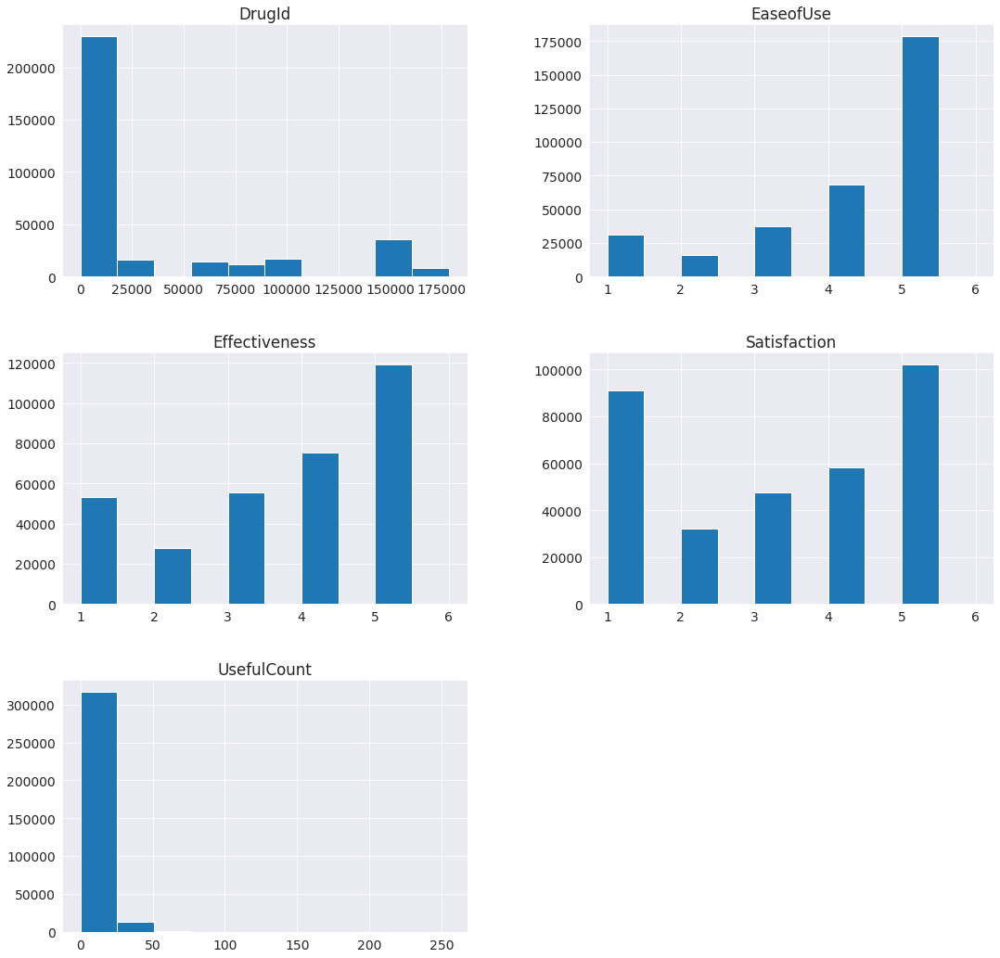

In [28]:
df.hist( figsize=(18,18))

In [29]:
df.DrugId.value_counts()

6873     7940
6007     7236
1025     7204
4398     5426
14208    5016
         ... 
353         1
78151       1
92236       1
1632        1
18441       1
Name: DrugId, Length: 6280, dtype: int64

In [30]:
fig = px.histogram(df, 
                   x='EaseofUse', 
                   marginal='box', 
                   #nbins=47, 
                   title='Distribution of Ease of use')
fig.update_layout(bargap=0.1)
fig.show()

# Preprocessing

In [31]:
dff = df.copy()

In [32]:
#Creating Side-effects from Side

def side_effect_add(data):
    if 'bleeding' in data.lower():
        return 'Severe Side Effects'
    elif 'clot' in data.lower():
        return 'Severe Side Effects'
    elif 'allergy' in data.lower():
        return 'Severe Side Effects'
    elif 'tremor' in data.lower():
        return 'Moderate Side Effects'
    elif 'insomnia' in data.lower():
        return 'Severe Side Effects'
    elif 'anxiety' in data.lower():
        return 'Severe Side Effects'
    elif 'swelling' in data.lower():
        return 'Moderate Side Effects'
    elif 'tension' in data.lower():
        return 'Moderate Side Effects'
    elif 'tb' in data.lower():
        return 'Severe Side Effects'
    elif 'rash' in data.lower():
        return 'Moderate Side Effects'
    elif 'fatigue' in data.lower():
        return 'Moderate Side Effects' 
    elif 'itching' in data.lower():
        return 'Moderate Side Effects'
    elif 'Vomiting' in data.lower():
        return 'Moderate Side Effects'
    elif 'cough' in data.lower():
        return 'Mild Side Effects'
    elif 'dizziness' in data.lower():
        return 'Common Side Effects'
    elif 'sneezing' in data.lower():
        return 'Common Side Effects'
    elif 'Tiredness' in data.lower():
        return 'Moderate Side Effects'
    elif 'loss of coordination' in data.lower():
        return 'Severe Side Effects'
    elif 'pain' in data.lower():
        return 'Severe Side Effects'
    elif 'gas' in data.lower():
        return 'Moderate Side Effects'
    elif 'bloating' in data.lower():
        return 'Moderate Side Effects'
    elif 'No Side Effects' in data:
        return 'No Side Effects'
    else:
        return 'Mild Side Effects'

In [33]:
dff['Side_effects'] = dff['Sides'].apply(side_effect_add)

dff['Side_effects'].value_counts()

Common Side Effects      148237
Mild Side Effects         67459
Moderate Side Effects     57630
Severe Side Effects       42284
No Side Effects           15935
Name: Side_effects, dtype: int64

In [34]:
#Conditions

In [35]:
pd.options.display.max_rows = 50
dff['Condition'].value_counts()[:50]

Other                                                           46920
Pain                                                            23349
High Blood Pressure                                             21361
Depression                                                      13644
Birth Control                                                   11029
Neuropathic Pain                                                 8292
Type 2 Diabetes Mellitus                                         6943
Chronic Trouble Sleeping                                         6763
Attention Deficit Disorder with Hyperactivity                    6256
Bipolar Depression                                               5509
Migraine Prevention                                              4556
Panic Disorder                                                   4537
Major Depressive Disorder                                        3899
Repeated Episodes of Anxiety                                     3877
Overweight          

Lets group conditions based on top categories above 1000 data

In [36]:
cond = []

def conditions_extract(data):
    if 'Pain' in data:
        return 'Pain'
    elif 'High Blood Pressure' in data:
        return 'High Blood Pressure'
    elif 'Depression' in data:
        return 'Depression'
    elif 'Birth Control' in data:
        return 'Birth Control'
    elif 'Neuropathic Pain' in data:
        return 'Neuropathic Pain'
    elif 'Chronic Trouble Sleeping' in data:
        return 'Chronic Trouble Sleeping'  
    elif 'Type 2 Diabetes Mellitus' in data:
        return 'Type 2 Diabetes Mellitus'
    elif 'Attention Deficit Disorder with Hyperactivity' in data:
        return 'Attention Deficit Disorder with Hyperactivity'
    elif 'Bipolar Depression' in data:
        return 'Bipolar Disorder'
    elif 'Mania associated with Bipolar Disorder' in data:
        return 'Bipolar Disorder'
    elif 'Bipolar Disorder in Remission' in data:
        return 'Bipolar Disorder'    
    elif 'Migraine Prevention' in data:
        return 'Migraine' 
    elif 'Panic Disorder' in data:
        return 'Panic Disorder'
    elif 'Major Depressive Disorder' in data:
        return 'Depression'
    elif 'Anxious' in data:
        return 'Repeated Episodes of Anxiety'
    elif 'Overweight' in data:
        return 'Overweight'
    elif 'Rheumatoid Arthritis' in data:
        return 'Rheumatoid Arthritis'
    elif 'Disorder characterized by Stiff, Tender & Painful Muscles' in data:
        return 'Disorder characterized by Stiff, Tender & Painful Muscles'
    elif 'Underactive Thyroid' in data:
        return 'Underactive Thyroid'
    elif 'Migraine Headache' in data:
        return 'Migraine'
    elif 'Anxious' in data:
        return 'Anxious'
    elif 'Chronic Pain' in data:
        return 'Pain'    
    elif 'Cough' in data:
        return 'Cough'
    elif 'Cold Symptoms' in data:
        return 'Cold'
    elif 'Stuffy Nose' in data:
        return 'Cold'
    elif 'Asthma' in data:
        return 'Asthma'
    elif '"Change of Life" Signs' in data:
        return 'Change of Life Signs'
    elif 'Pain Originating From a Nerve' in data:
        return 'Pain Originating From a Nerve'
    elif 'Joint Damage causing Pain and Loss of Function' in data:
        return 'Pain & Loss of Function'
    elif 'Acne' in data:
        return 'Pain'
    elif 'Repeated Episodes of Anxiety' in data:
        return 'Repeated Episodes of Anxiety'
    elif 'Muscle Spasm' in data:
        return 'Muscle Spasm'
    elif 'Condition in which Stomach Acid is Pushed Into the Esophagus' in data:
        return 'Stomach Acid is Pushed Into the Esophagus'
    elif 'Stop Smoking' in data:
        return 'Smoking'
    elif 'Chronic Pain with Narcotic Drug Tolerance' in data:
        return 'Chronic Pain with Narcotic Drug Tolerance'
    elif 'Decreased Bone Mass Following Menopause' in data:
        return 'Menopause'
    elif 'Enlarged Prostate' in data:
        return 'Enlarged Prostate'    
    elif 'Emptying of the Bowel' in data:
        return 'Bowel Problems'
    elif 'Irritable Colon' in data:
        return 'Bowel Problems'
    elif 'Crohn' in data:
        return 'Bowel Problems'
    elif 'Incomplete or Infrequent Bowel Movements' in data:    
        return 'Bowel Problems'
    elif 'Osteoporosis' in data:
        return 'Osteoporosis'
    elif 'Epileptic Seizure' in data:
        return 'Epileptic Seizure'
    elif 'Extreme Discomfort in Calves when Sitting or Lying Down' in data:
        return 'Extreme Discomfort in Calves when Sitting or Lying Down'
    elif 'Abnormally Long or Heavy Periods' in data:
        return 'Abnormal Periods'
    elif 'Bacterial Urinary Tract Infection' in data:
        return 'Urinary Infection'
    elif 'Disease of Ovaries with Cysts' in data:
        return 'Disease of Ovaries with Cysts'
    elif 'Bipolar I Disorder with Most Recent Episode Mixed' in data:
        return 'Bipolar Disorder'
    elif 'Inflammation of the Nose due to an Allergy' in data:
        return 'Inflammation of the Nose due to an Allergy'
    elif 'Manic-Depression' in data:
        return 'Manic-Depression'
    elif 'Inability to have an Erection' in data:
        return 'Erectyle Disfunction'
    elif 'Simple Partial Seizures' in data:
        return 'Seizures'
    elif 'Convulsive Seizures' in data:
        return 'Seizures'
    else:
        return 'Others'


In [37]:
dff['Condition_grouped'] = dff['Condition'].apply(conditions_extract)

dff['Condition_grouped'].value_counts()

Others                                                     134880
Pain                                                        52245
Depression                                                  26026
High Blood Pressure                                         21491
Birth Control                                               11029
Migraine                                                     7400
Type 2 Diabetes Mellitus                                     7310
Chronic Trouble Sleeping                                     6763
Repeated Episodes of Anxiety                                 6643
Attention Deficit Disorder with Hyperactivity                6256
Panic Disorder                                               4537
Bowel Problems                                               4093
Asthma                                                       3828
Overweight                                                   3726
Rheumatoid Arthritis                                         3678
Underactiv

In [38]:
dff.head()

,Age,Condition,Date,Drug,DrugId,EaseofUse,Effectiveness,Reviews,Satisfaction,Sex,Sides,UsefulCount,Age_group,Side_effects,Condition_grouped
0,75 or over,Stuffy Nose,9/21/2014,25dph-7.5peh,146724,5,5,I'm a retired physician and of all the meds I ...,5,Male,"Drowsiness, dizziness , dry mouth /nose/thro...",0,Elderly,Common Side Effects,Cold
1,25-34,Cold Symptoms,1/13/2011,25dph-7.5peh,146724,5,5,cleared me right up even with my throat hurtin...,5,Female,"Drowsiness, dizziness , dry mouth /nose/thro...",1,Young,Common Side Effects,Cold
2,65-74,Other,7/16/2012,warfarin (bulk) 100 % powder,144731,2,3,why did my PTINR go from a normal of 2.5 to ov...,3,Female,No Side Effects,0,Elderly,No Side Effects,Others
3,75 or over,Other,9/23/2010,warfarin (bulk) 100 % powder,144731,2,2,FALLING AND DON'T REALISE IT,1,Female,No Side Effects,0,Elderly,No Side Effects,Others
4,35-44,Other,1/6/2009,warfarin (bulk) 100 % powder,144731,1,1,My grandfather was prescribed this medication ...,1,Male,No Side Effects,1,Young,No Side Effects,Others


In [39]:
dff.shape

(331545, 15)

In [40]:
#Date Column - year extraction

dff["year"] = pd.to_datetime(dff.Date, format="%m/%d/%Y").dt.year

In [41]:

fig = px.histogram(dff, 
                   x='year', 
                   nbins=24, 
                   title='Distribution of year')
fig.update_layout(bargap=0.1)
fig.show()

# Visualizations

In [42]:
ct = dff.groupby(['year'])['Reviews'].nunique()
fig = px.bar(dff,x=ct.index,y=ct,title="Reviews per year",labels={
                     "x": "Year",
                     "y": "Review Count"
                 })
fig.show()

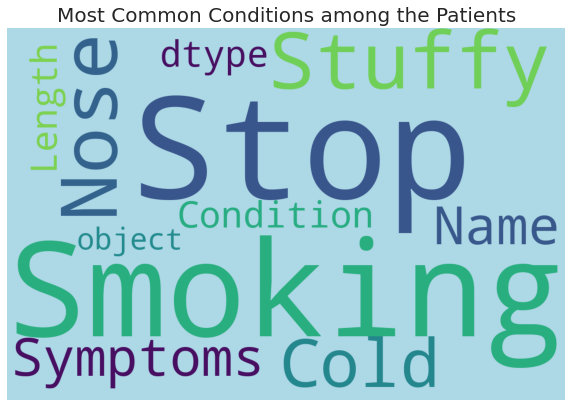

In [43]:
from wordcloud import WordCloud
from wordcloud import STOPWORDS

stopwords = set(STOPWORDS)

wordcloud = WordCloud(background_color = 'lightblue', stopwords = stopwords, max_words = 100, width = 1200, height = 800).generate(str(dff['Condition']))

plt.rcParams['figure.figsize'] = (10, 10)
plt.title('Most Common Conditions among the Patients', fontsize = 20)
print(wordcloud)
plt.axis('off')
plt.imshow(wordcloud)
plt.show()

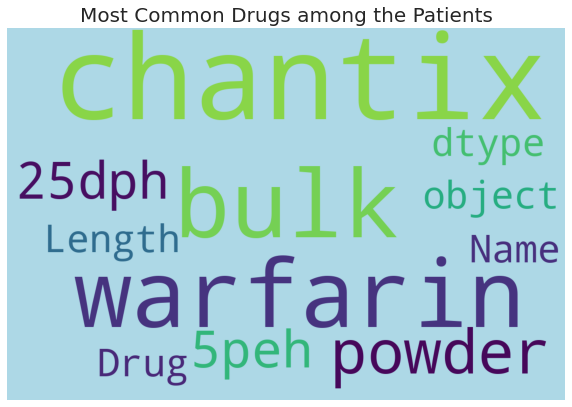

In [44]:
from wordcloud import WordCloud
from wordcloud import STOPWORDS

stopwords = set(STOPWORDS)

wordcloud = WordCloud(background_color = 'lightblue', stopwords = stopwords, max_words = 100, width = 1200, height = 800).generate(str(dff['Drug']))

plt.rcParams['figure.figsize'] = (10, 10)
plt.title('Most Common Drugs among the Patients', fontsize = 20)
print(wordcloud)
plt.axis('off')
plt.imshow(wordcloud)
plt.show()

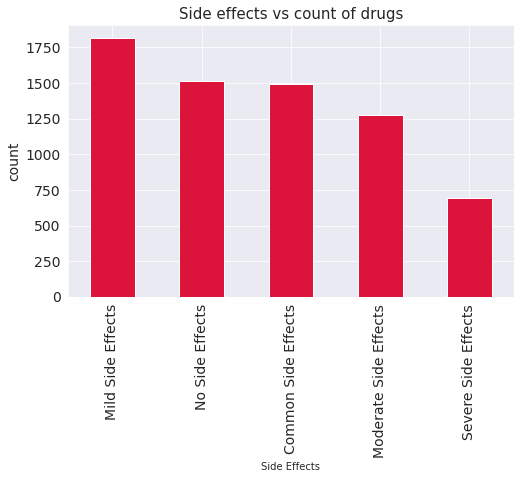

In [45]:
# checking side effects count per drugs

dff.groupby(['Side_effects'])['Drug'].nunique().sort_values(ascending = False).plot.bar(figsize = (8, 5), color = 'crimson')
plt.title('Side effects vs count of drugs', fontsize = 15)
plt.xlabel('Side Effects', fontsize = 10)
plt.ylabel('count')
plt.show()

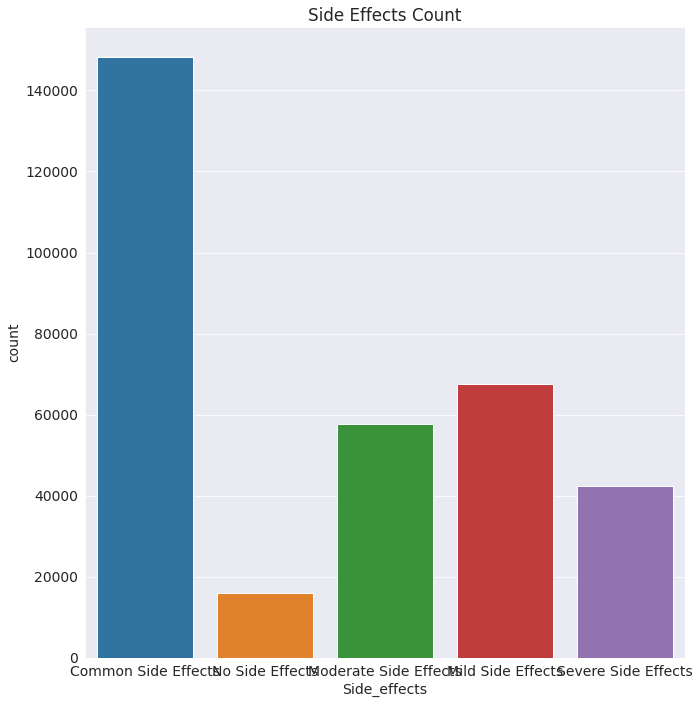

In [46]:
sns.countplot(dff['Side_effects'])
plt.title("Side Effects Count")
plt.tight_layout()

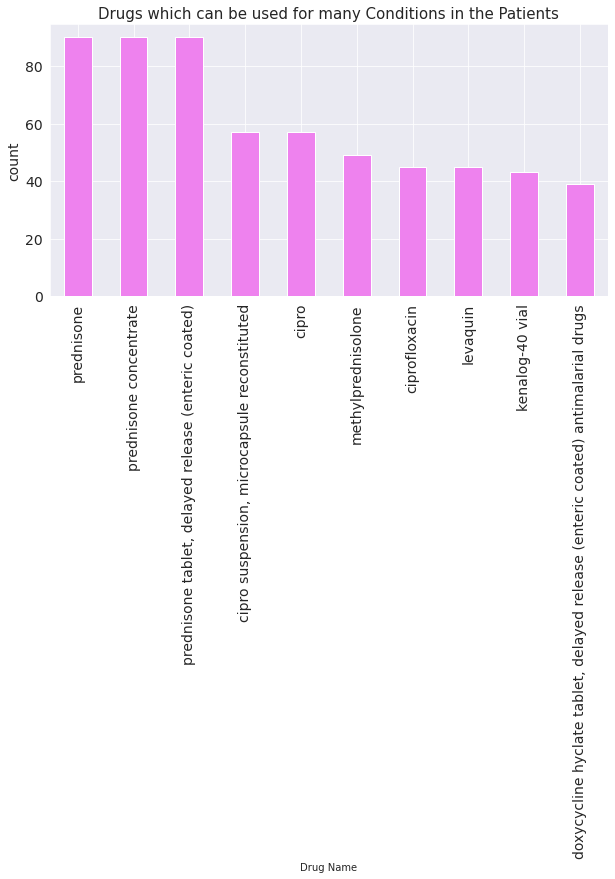

In [47]:
# checking Drugs which can be used for many Conditions in the Patients

dff.groupby(['Drug'])['Condition'].nunique().sort_values(ascending = False).head(10).plot.bar(figsize = (10, 5), color = 'violet')
plt.title('Drugs which can be used for many Conditions in the Patients', fontsize = 15)
plt.xlabel('Drug Name', fontsize = 10)
plt.ylabel('count')
plt.show()

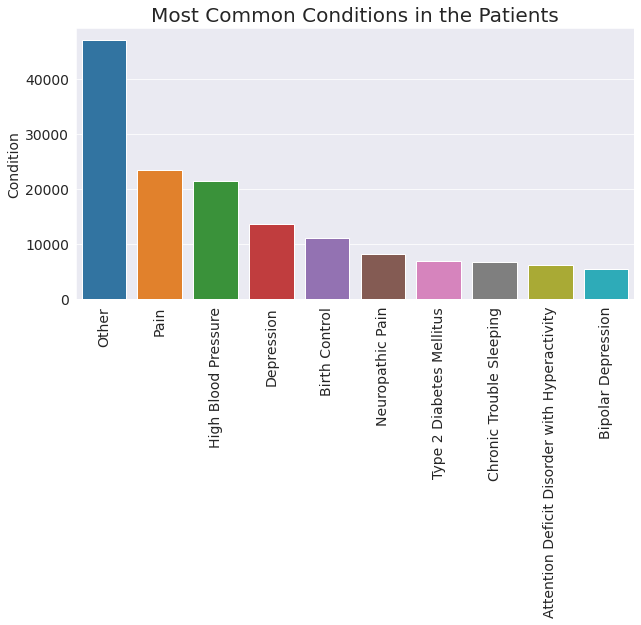

In [48]:
cat_num = dff['Condition'].value_counts()[:10]
#print("graph for %s: total = %d" % (i, len(cat_num)))
plt.figure(figsize=(10,5))
chart = sns.barplot(x=cat_num.index, y=cat_num)
chart.set_xticklabels(chart.get_xticklabels(), rotation=90)
plt.title('Most Common Conditions in the Patients', fontsize = 20)
plt.show()

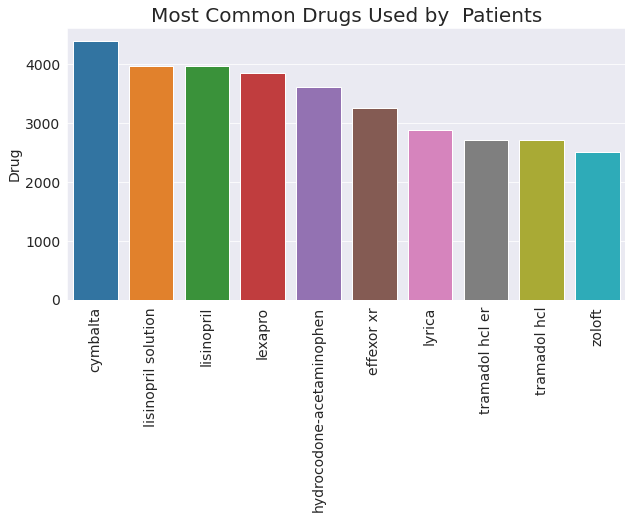

In [49]:
cat_num = dff['Drug'].value_counts()[:10]
#print("graph for %s: total = %d" % (i, len(cat_num)))
plt.figure(figsize=(10,5))
chart = sns.barplot(x=cat_num.index, y=cat_num)
chart.set_xticklabels(chart.get_xticklabels(), rotation=90)
plt.title('Most Common Drugs Used by  Patients', fontsize = 20)
plt.show()

In [50]:
con = dff[['Drug','Condition']]
con.value_counts()[:10]

Drug                       Condition                
lisinopril solution        High Blood Pressure          3564
lisinopril                 High Blood Pressure          3564
hydrocodone-acetaminophen  Pain                         3503
phentermine hcl            Overweight                   2057
cymbalta                   Major Depressive Disorder    1831
lexapro                    Depression                   1788
effexor xr                 Depression                   1727
tramadol hcl er            Pain                         1572
tramadol hcl               Pain                         1572
trazodone hcl              Chronic Trouble Sleeping     1559
dtype: int64

In [51]:
con = dff[['Drug','Condition_grouped']]
ccc = con.value_counts()[:10]

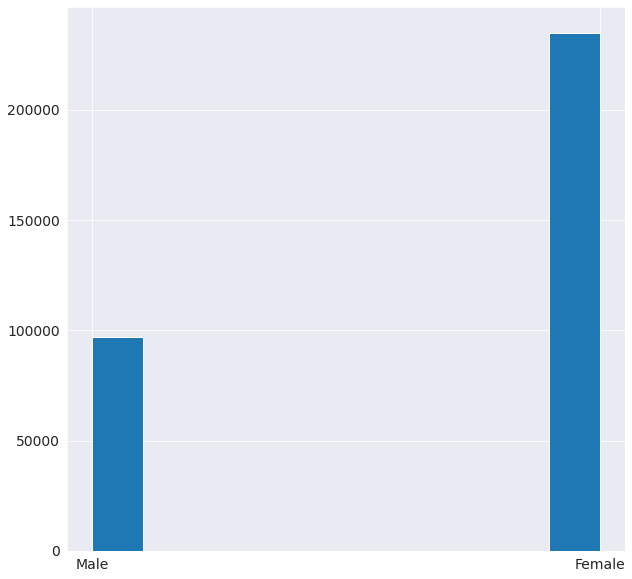

In [52]:
dff.Sex.hist()

In [53]:
px.histogram(dff, x='Side_effects', color='Sex')

In [54]:
depression = dff[dff['Condition_grouped']=='Depression']

#depression = dff[dff['Condition'].str.contains("Depression|depression|anxiety|Depressive|depressive|Anxiousness|OCD|stress|trauma", na=False)]

In [55]:
depression

,Age,Condition,Date,Drug,DrugId,EaseofUse,Effectiveness,Reviews,Satisfaction,Sex,Sides,UsefulCount,Age_group,Side_effects,Condition_grouped,year
3611,55-64,Anxiousness associated with Depression,5/17/2015,loxapine,14375,4,3,,2,Female,"Drowsiness, dizziness , lightheadedness , c...",1,Middle Age,Common Side Effects,Depression,2015
3612,25-34,Anxiousness associated with Depression,1/28/2013,loxapine,14375,5,4,i like the fact i canwake up and feel like i c...,1,Female,"Drowsiness, dizziness , lightheadedness , c...",3,Young,Common Side Effects,Depression,2013
3613,45-54,Anxiousness associated with Depression,1/25/2012,loxapine,14375,1,1,a very dangerous drug especially that should b...,1,Male,"Drowsiness, dizziness , lightheadedness , c...",2,Middle Age,Common Side Effects,Depression,2012
3618,55-64,Anxiousness associated with Depression,1/31/2008,loxapine,14375,5,5,MY HUSBAND HAS TAKEN THIS MEDICATION FOR BIPOL...,5,Female,"Drowsiness, dizziness , lightheadedness , c...",4,Middle Age,Common Side Effects,Depression,2008
7608,35-44,Additional Medications to Treat Depression,7/26/2011,lithobid,6874,4,5,Only downfalls are having to get your bloodwor...,5,Female,"Drowsiness, dizziness , tiredness, increased ...",0,Young,Moderate Side Effects,Depression,2011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361498,45-54,Depression,12/26/2007,celexa,8603,5,5,,5,Female,"Nausea , dry mouth , loss of appetite, tiredn...",1,Middle Age,Mild Side Effects,Depression,2007
361499,25-34,Bipolar Depression,12/26/2007,celexa,8603,5,3,,4,Female,"Nausea , dry mouth , loss of appetite, tiredn...",0,Young,Mild Side Effects,Depression,2007
361501,13-18,Depression,12/21/2007,celexa,8603,5,1,Didn't help what-so-ever for my depression and...,1,Female,"Nausea , dry mouth , loss of appetite, tiredn...",2,Young,Mild Side Effects,Depression,2007
361504,35-44,Depression,12/20/2007,celexa,8603,5,5,I suffer from depression and noticed that when...,5,Female,"Nausea , dry mouth , loss of appetite, tiredn...",8,Young,Mild Side Effects,Depression,2007


In [56]:
depression.Drug.value_counts()

lexapro                         2185
effexor xr                      2011
cymbalta                        1867
zoloft                          1440
celexa                          1300
                                ... 
asenapine tablet, sublingual       1
trimipramine maleate               1
carbamazepine er                   1
irenka                             1
protriptyline hcl                  1
Name: Drug, Length: 164, dtype: int64

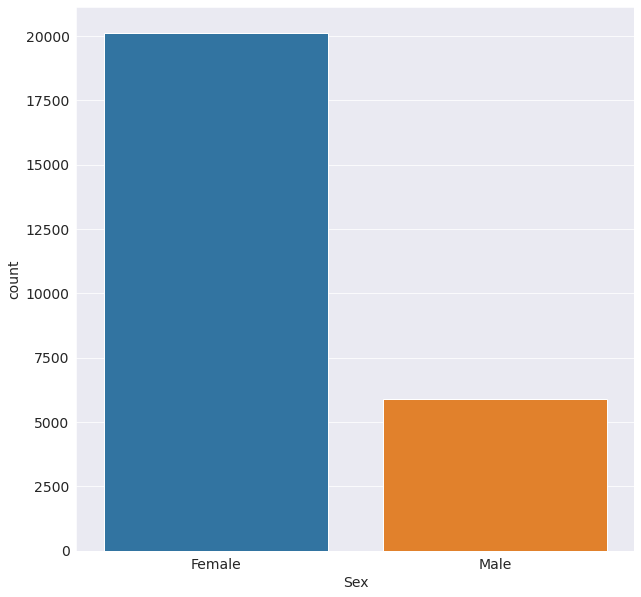

In [57]:
sns.countplot(x=depression['Sex'])

In [58]:
px.histogram(depression, x='Side_effects', color='Sex')

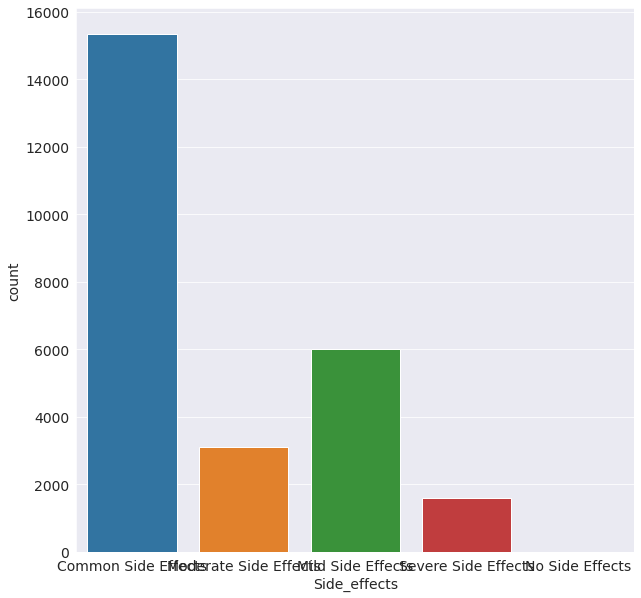

In [59]:
sns.countplot(depression['Side_effects'])

In [60]:
dff.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 331545 entries, 0 to 362805
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   Age                331545 non-null  object
 1   Condition          331545 non-null  object
 2   Date               331545 non-null  object
 3   Drug               331545 non-null  object
 4   DrugId             331545 non-null  int64 
 5   EaseofUse          331545 non-null  int64 
 6   Effectiveness      331545 non-null  int64 
 7   Reviews            331545 non-null  object
 8   Satisfaction       331545 non-null  int64 
 9   Sex                331545 non-null  object
 10  Sides              331545 non-null  object
 11  UsefulCount        331545 non-null  int64 
 12  Age_group          331545 non-null  object
 13  Side_effects       331545 non-null  object
 14  Condition_grouped  331545 non-null  object
 15  year               331545 non-null  int64 
dtypes: int64(6), object(

In [61]:
#Columns to be dropped
#Age, Date, DrugId, REviews, Sides
dff = dff.drop(['Age','Date','DrugId','Reviews','Sides','year','Condition'],axis=1)

In [62]:
data = dff.copy()

In [63]:
data.head()

,Drug,EaseofUse,Effectiveness,Satisfaction,Sex,UsefulCount,Age_group,Side_effects,Condition_grouped
0,25dph-7.5peh,5,5,5,Male,0,Elderly,Common Side Effects,Cold
1,25dph-7.5peh,5,5,5,Female,1,Young,Common Side Effects,Cold
2,warfarin (bulk) 100 % powder,2,3,3,Female,0,Elderly,No Side Effects,Others
3,warfarin (bulk) 100 % powder,2,2,1,Female,0,Elderly,No Side Effects,Others
4,warfarin (bulk) 100 % powder,1,1,1,Male,1,Young,No Side Effects,Others


In [64]:
data.corr()

,EaseofUse,Effectiveness,Satisfaction,UsefulCount
EaseofUse,1.000000,0.531248,0.552483,0.027838
Effectiveness,0.531248,1.000000,0.792821,0.049235
Satisfaction,0.552483,0.792821,1.000000,0.018712
UsefulCount,0.027838,0.049235,0.018712,1.000000


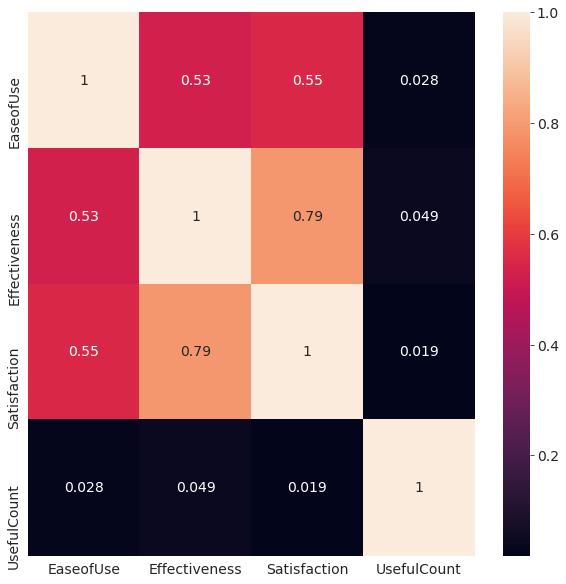

In [65]:
sns.heatmap(data.corr(),annot=True)

Satisfaction and effectiveness have a correlation. 

Also UsefulCount is just number of users who found review useful. So its not that much needed and can be omitted.


In [66]:
data = data.drop(['Satisfaction','UsefulCount'],axis=1)

# Encoding

In [67]:
data.head()

,Drug,EaseofUse,Effectiveness,Sex,Age_group,Side_effects,Condition_grouped
0,25dph-7.5peh,5,5,Male,Elderly,Common Side Effects,Cold
1,25dph-7.5peh,5,5,Female,Young,Common Side Effects,Cold
2,warfarin (bulk) 100 % powder,2,3,Female,Elderly,No Side Effects,Others
3,warfarin (bulk) 100 % powder,2,2,Female,Elderly,No Side Effects,Others
4,warfarin (bulk) 100 % powder,1,1,Male,Young,No Side Effects,Others


In [68]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()

In [69]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 331545 entries, 0 to 362805
Data columns (total 7 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   Drug               331545 non-null  object
 1   EaseofUse          331545 non-null  int64 
 2   Effectiveness      331545 non-null  int64 
 3   Sex                331545 non-null  object
 4   Age_group          331545 non-null  object
 5   Side_effects       331545 non-null  object
 6   Condition_grouped  331545 non-null  object
dtypes: int64(2), object(5)
memory usage: 30.2+ MB


In [70]:
#data['Drug'] = label_encoder.fit_transform(data['Drug'].astype(str))

In [71]:
data.Drug.value_counts()

cymbalta                                                      4400
lisinopril solution                                           3970
lisinopril                                                    3970
lexapro                                                       3855
hydrocodone-acetaminophen                                     3617
                                                              ... 
systane dropperette, single use dropper                          1
empagliflozin tablet                                             1
zidovudine                                                       1
banana flakes-transgalactooligosacchar. oral powder packet       1
aleve-d sinus and headache                                       1
Name: Drug, Length: 6793, dtype: int64

In [72]:
data['Age_group'] = label_encoder.fit_transform(data['Age_group'])

In [73]:
data.Age_group.value_counts()

1    146105
3    130531
0     52038
2      2871
Name: Age_group, dtype: int64

0 -- Elderly      
1 -- Middle Age            
2 -- Pediatric        
3 -- Young


In [74]:
dff.Side_effects.value_counts()

Common Side Effects      148237
Mild Side Effects         67459
Moderate Side Effects     57630
Severe Side Effects       42284
No Side Effects           15935
Name: Side_effects, dtype: int64

In [75]:
data['Side_effects'] = label_encoder.fit_transform(data['Side_effects'])

In [76]:
data.Side_effects.value_counts()

0    148237
1     67459
2     57630
4     42284
3     15935
Name: Side_effects, dtype: int64

0 -- Common Side Effects          
1 -- Mild Side Effects       
2 -- Moderate Side Effects         
3 -- No Side Effects  
4 -- Severe Side Effects

Base N Encoder


Binary encoding creates fewer columns than one-hot encoding. It is more memory efficient. It also reduces the chances of dimensionality problems with higher cardinality.

In [77]:
pip install category_encoders

     |████████████████████████████████| 80 kB 3.4 MB/s 


In [78]:
import category_encoders as ce
encoder= ce.BaseNEncoder(cols=['Drug'],return_df=True,base=5)

In [79]:
data_encoded=encoder.fit_transform(data)
data_encoded

,Drug_0,Drug_1,Drug_2,Drug_3,Drug_4,Drug_5,Drug_6,EaseofUse,Effectiveness,Sex,Age_group,Side_effects,Condition_grouped
0,0,0,0,0,0,0,1,5,5,Male,0,0,Cold
1,0,0,0,0,0,0,1,5,5,Female,3,0,Cold
2,0,0,0,0,0,0,2,2,3,Female,0,3,Others
3,0,0,0,0,0,0,2,2,2,Female,0,3,Others
4,0,0,0,0,0,0,2,1,1,Male,3,3,Others
...,...,...,...,...,...,...,...,...,...,...,...,...,...
362799,0,2,0,4,1,3,2,2,4,Female,3,2,Smoking
362801,0,2,0,4,1,3,2,5,5,Female,1,2,Smoking
362803,0,2,0,4,1,3,2,2,4,Female,3,2,Smoking
362804,0,2,0,4,1,3,2,5,5,Male,1,2,Smoking


In [80]:
update = data_encoded.copy()

In [81]:
update = pd.get_dummies(update, drop_first=True)

In [82]:
update.tail()

,Drug_0,Drug_1,Drug_2,Drug_3,Drug_4,Drug_5,Drug_6,EaseofUse,Effectiveness,Age_group,Side_effects,Sex_Male,Condition_grouped_Asthma,Condition_grouped_Attention Deficit Disorder with Hyperactivity,Condition_grouped_Bipolar Disorder,Condition_grouped_Birth Control,Condition_grouped_Bowel Problems,Condition_grouped_Change of Life Signs,Condition_grouped_Chronic Trouble Sleeping,Condition_grouped_Cold,Condition_grouped_Cough,Condition_grouped_Depression,Condition_grouped_Disease of Ovaries with Cysts,Condition_grouped_Enlarged Prostate,Condition_grouped_Epileptic Seizure,Condition_grouped_Erectyle Disfunction,Condition_grouped_Extreme Discomfort in Calves when Sitting or Lying Down,Condition_grouped_High Blood Pressure,Condition_grouped_Inflammation of the Nose due to an Allergy,Condition_grouped_Menopause,Condition_grouped_Migraine,Condition_grouped_Muscle Spasm,Condition_grouped_Osteoporosis,Condition_grouped_Others,Condition_grouped_Overweight,Condition_grouped_Pain,Condition_grouped_Panic Disorder,Condition_grouped_Repeated Episodes of Anxiety,Condition_grouped_Rheumatoid Arthritis,Condition_grouped_Seizures,Condition_grouped_Smoking,Condition_grouped_Stomach Acid is Pushed Into the Esophagus,Condition_grouped_Type 2 Diabetes Mellitus,Condition_grouped_Underactive Thyroid,Condition_grouped_Urinary Infection
362799,0,2,0,4,1,3,2,2,4,3,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
362801,0,2,0,4,1,3,2,5,5,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
362803,0,2,0,4,1,3,2,2,4,3,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
362804,0,2,0,4,1,3,2,5,5,1,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
362805,0,2,0,4,1,3,2,4,5,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [85]:
update =update.drop(['Drug_0'],axis=1)

# **Splitting the dataset**

In [86]:
X = update.drop(['Side_effects'],axis=1)
y = update['Side_effects']

In [87]:
X.shape, y.shape

((331545, 43), (331545,))

# **Train Test Split**

In [88]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,random_state=42,test_size=0.35)

In [89]:
X_train.shape, y_train.shape,X_test.shape, y_test.shape

((215504, 43), (215504,), (116041, 43), (116041,))

# **Modelling**

In [90]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

In [91]:
#Logistic Regression

In [92]:
from sklearn.linear_model import LogisticRegression
logistic_model=LogisticRegression(multi_class='ovr')
logistic_model.fit(X_train,y_train)
ypred=logistic_model.predict(X_test)
print(classification_report(y_test,ypred))

              precision    recall  f1-score   support

           0       0.55      0.86      0.67     51962
           1       0.44      0.37      0.40     23523
           2       0.62      0.25      0.35     20277
           3       0.38      0.04      0.07      5497
           4       0.43      0.19      0.27     14782

    accuracy                           0.53    116041
   macro avg       0.48      0.34      0.35    116041
weighted avg       0.52      0.53      0.48    116041



In [93]:
#Scaling

In [94]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train_sc = sc.fit_transform(X_train)
X_test_sc = sc.transform(X_test)
logistic_model.fit(X_train_sc,y_train)
ypred=logistic_model.predict(X_test_sc)
print(classification_report(y_test,ypred))

              precision    recall  f1-score   support

           0       0.55      0.86      0.67     51962
           1       0.44      0.37      0.41     23523
           2       0.63      0.26      0.37     20277
           3       0.39      0.04      0.07      5497
           4       0.43      0.19      0.27     14782

    accuracy                           0.53    116041
   macro avg       0.49      0.35      0.36    116041
weighted avg       0.52      0.53      0.49    116041



In [95]:
#Minmax

In [96]:
from sklearn.preprocessing import MinMaxScaler
mm = MinMaxScaler()
X_train_mm = mm.fit_transform(X_train)
X_test_mm = mm.transform(X_test)
logistic_model.fit(X_train_mm,y_train)
ypred=logistic_model.predict(X_test_mm)
print(classification_report(y_test,ypred))

              precision    recall  f1-score   support

           0       0.55      0.86      0.67     51962
           1       0.45      0.37      0.41     23523
           2       0.63      0.26      0.37     20277
           3       0.39      0.04      0.07      5497
           4       0.43      0.19      0.27     14782

    accuracy                           0.53    116041
   macro avg       0.49      0.35      0.36    116041
weighted avg       0.52      0.53      0.49    116041



In [97]:
#KNN

In [98]:
from sklearn.neighbors import KNeighborsClassifier

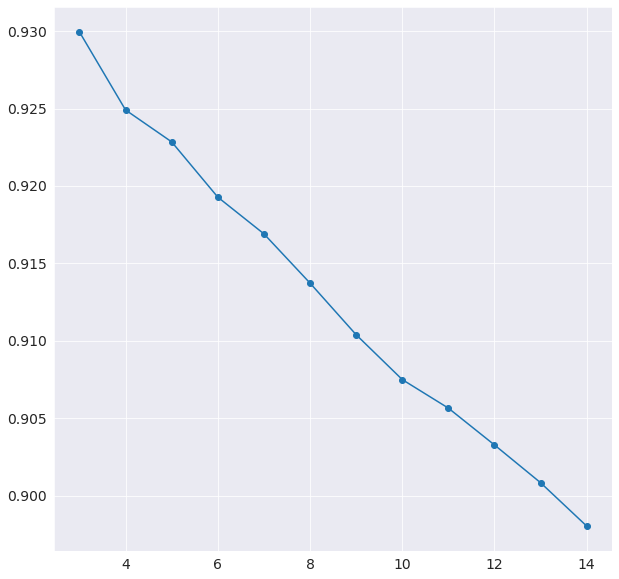

In [ ]:

acc_values=[]
neighbors=np.arange(3,15)
for k in neighbors: 
    classifier=KNeighborsClassifier(n_neighbors=k,metric='minkowski')
    classifier.fit(X_train,y_train)
    y_pred=classifier.predict(X_test)
    acc=accuracy_score(y_test,y_pred)
    acc_values.append(acc)
plt.plot(neighbors,acc_values,'o-')

In [99]:
classifier=KNeighborsClassifier(n_neighbors=3,metric='minkowski')     # any value of neighbours at which accuracy is max can be considered.
classifier.fit(X_train,y_train)
ypred=classifier.predict(X_test)
print(classification_report(y_test,ypred))

              precision    recall  f1-score   support

           0       0.94      0.97      0.95     51962
           1       0.92      0.91      0.92     23523
           2       0.93      0.90      0.92     20277
           3       0.89      0.75      0.81      5497
           4       0.93      0.92      0.93     14782

    accuracy                           0.93    116041
   macro avg       0.92      0.89      0.90    116041
weighted avg       0.93      0.93      0.93    116041



In [100]:
#SVM

In [101]:
#from sklearn.svm import SVC
#svm_linear=SVC(kernel='linear',probability=True)
#svm_linear.fit(X_train_sc,y_train)
#ypred=svm_linear.predict(X_test_sc)
#print(classification_report(y_test,ypred))

In [102]:
#SVM takes a lot of training time.

In [103]:
#Decision Tree

In [104]:
%%time
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier()
dt.fit(X_train,y_train)
ypred=dt.predict(X_test)
print(classification_report(y_test,ypred))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99     51962
           1       0.98      0.98      0.98     23523
           2       0.98      0.98      0.98     20277
           3       0.95      0.94      0.94      5497
           4       0.99      0.99      0.99     14782

    accuracy                           0.99    116041
   macro avg       0.98      0.98      0.98    116041
weighted avg       0.99      0.99      0.99    116041

CPU times: user 1.81 s, sys: 23 ms, total: 1.83 s
Wall time: 1.85 s


In [105]:
#Random Forest

In [106]:
%%time
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier()
rf.fit(X_train,y_train)
ypred=rf.predict(X_test)
print(classification_report(y_test,ypred))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98     51962
           1       0.96      0.97      0.97     23523
           2       0.97      0.97      0.97     20277
           3       0.97      0.83      0.90      5497
           4       0.98      0.97      0.97     14782

    accuracy                           0.97    116041
   macro avg       0.97      0.95      0.96    116041
weighted avg       0.97      0.97      0.97    116041

CPU times: user 34 s, sys: 418 ms, total: 34.5 s
Wall time: 34.3 s


In [107]:
feature_importances = pd.DataFrame(rf.feature_importances_, index =X.columns,  columns=['importance']).sort_values('importance', ascending=False)
feature_importances

,importance
Drug_3,0.141414
Drug_5,0.138057
Drug_2,0.128209
Drug_6,0.123649
Drug_4,0.122243
Drug_1,0.064714
Condition_grouped_Birth Control,0.029080
Condition_grouped_Others,0.025096
Effectiveness,0.022098
Age_group,0.020003


In [108]:
#Gradient Boost

In [109]:
from sklearn.ensemble import GradientBoostingClassifier
gb=GradientBoostingClassifier()
gb.fit(X_train,y_train)
ypred=gb.predict(X_test)
print(classification_report(y_test,ypred))

              precision    recall  f1-score   support

           0       0.65      0.92      0.76     51962
           1       0.71      0.59      0.65     23523
           2       0.79      0.40      0.53     20277
           3       0.66      0.33      0.44      5497
           4       0.71      0.51      0.60     14782

    accuracy                           0.68    116041
   macro avg       0.71      0.55      0.60    116041
weighted avg       0.70      0.68      0.66    116041



In [110]:
#Naive Bayes

In [111]:
from sklearn.naive_bayes import GaussianNB
nb=GaussianNB()
nb.fit(X_train,y_train)
ypred=nb.predict(X_test)
print(classification_report(y_test,ypred))

              precision    recall  f1-score   support

           0       0.90      0.19      0.32     51962
           1       0.46      0.20      0.28     23523
           2       0.32      0.30      0.31     20277
           3       0.08      0.97      0.14      5497
           4       0.31      0.10      0.15     14782

    accuracy                           0.24    116041
   macro avg       0.41      0.35      0.24    116041
weighted avg       0.59      0.24      0.28    116041



In [112]:
#XG Boost

In [113]:
from xgboost import XGBClassifier
xgb=XGBClassifier()
xgb.fit(X_train,y_train)
ypred=xgb.predict(X_test)
print(classification_report(y_test,ypred))

              precision    recall  f1-score   support

           0       0.60      0.94      0.73     51962
           1       0.68      0.53      0.60     23523
           2       0.83      0.23      0.36     20277
           3       0.77      0.20      0.31      5497
           4       0.66      0.42      0.51     14782

    accuracy                           0.63    116041
   macro avg       0.71      0.46      0.50    116041
weighted avg       0.67      0.63      0.59    116041



# **ROC**

In [114]:
%%time
#Prediction probabilities for logistic regression with and without scaling
pred_prob1 = logistic_model.predict_proba(X_test)
pred_prob2 = logistic_model.predict_proba(X_test_mm)
pred_prob3 =logistic_model.predict_proba(X_test_sc)
#Prediction probabilities for kNN without scaling
pred_prob4 = classifier.predict_proba(X_test)
#Prediction Probabilities for Decision Tree classifier 
pred_prob5 = dt.predict_proba(X_test)
#Prediction Probabilities for Random Forest classifier 
pred_prob6 = rf.predict_proba(X_test)
#Prediction Probabilities for Gradient Boosting classifier 
pred_prob7 = gb.predict_proba(X_test)
#Prediction Probabilities for Extreme Gradient Boosting classifier 
pred_prob8 = xgb.predict_proba(X_test)
#Prediction Probabilities for Naive Bayes classifier 
pred_prob9 = nb.predict_proba(X_test)

CPU times: user 2min 9s, sys: 270 ms, total: 2min 9s
Wall time: 2min 8s


In [115]:
from sklearn.metrics import roc_curve
fpr1, tpr1, thr1 = roc_curve(y_test, pred_prob1[:,1], pos_label=1)
fpr2, tpr2, thr2 = roc_curve(y_test, pred_prob2[:,1], pos_label=1)
fpr3, tpr3, thr3 = roc_curve(y_test, pred_prob3[:,1], pos_label=1)
fpr4, tpr4, thr4 = roc_curve(y_test, pred_prob4[:,1], pos_label=1)
fpr5, tpr5, thr5 = roc_curve(y_test, pred_prob5[:,1], pos_label=1)
fpr6, tpr6, thr6 = roc_curve(y_test, pred_prob6[:,1], pos_label=1)
fpr7, tpr7, thr7 = roc_curve(y_test, pred_prob7[:,1], pos_label=1)
fpr8, tpr8, thr8 = roc_curve(y_test, pred_prob8[:,1], pos_label=1)
fpr9, tpr9, thr9 = roc_curve(y_test, pred_prob9[:,1], pos_label=1)

# roc curve for tpr = fpr 
random_probs = [0 for i in range(len(y_test))]
p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)

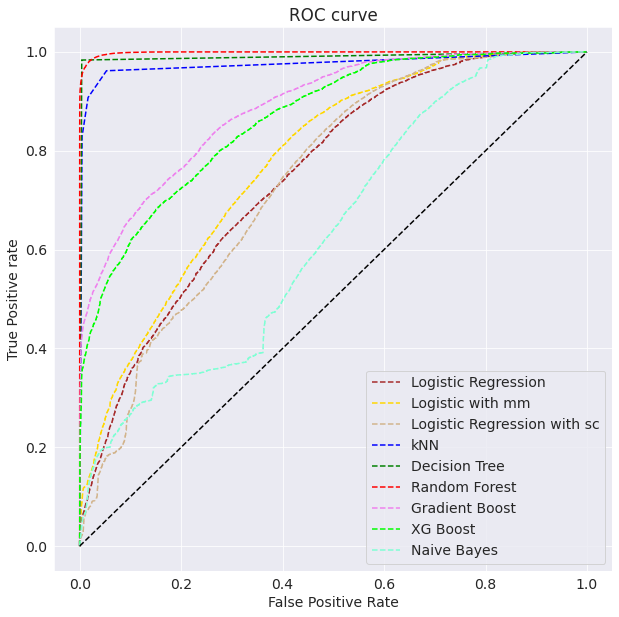

<Figure size 720x720 with 0 Axes>

In [116]:
plt.plot(fpr1, tpr1, linestyle='--',color='brown', label='Logistic Regression')
plt.plot(fpr2, tpr2, linestyle='--',color='gold', label='Logistic with mm')
plt.plot(fpr3, tpr3, linestyle='--',color='tan', label='Logistic Regression with sc')

plt.plot(fpr4, tpr4, linestyle='--',color='blue', label='kNN')
plt.plot(fpr5, tpr5, linestyle='--',color='green', label='Decision Tree')
plt.plot(fpr6, tpr6, linestyle='--',color='red', label='Random Forest')

plt.plot(fpr7, tpr7, linestyle='--',color='violet', label='Gradient Boost')
plt.plot(fpr8, tpr8, linestyle='--',color='lime', label='XG Boost')
plt.plot(fpr9, tpr9, linestyle='--',color='aquamarine', label='Naive Bayes')


plt.plot(p_fpr, p_tpr, linestyle='--', color='black')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.show();
plt.savefig('Multiclass ROC',dpi=1000); 